# Implementing facebook's Wav2Vec2 model for speech to text application

In [7]:
!pip install pydub # to convert our mp3 to a wav file

In [8]:
# importing the libraries

from IPython.display import Audio
from scipy.io import wavfile
import numpy as np
from pydub import AudioSegment

1. IPython.display.Audio

  - **What it is**: This module is part of the IPython library and is used to display audio directly within a Jupyter notebook or similar interactive environments.
  
  - **Use in Speech-to-Text**: You can use Audio to play back audio files, allowing you to listen to your input or processed audio during the development and debugging phases of your speech-to-text application.

2. scipy.io.wavfile

  - **What it is**: This module from the SciPy library provides tools to read and write `.wav` audio files.

  - **Use in Speech-to-Text**:
    - Loading Audio Data: You can use wavfile.read() to read `.wav` audio files and extract the sample rate and raw audio data as a NumPy array.
    - Saving Processed Audio: You can save audio data using wavfile.write() after any processing (if needed).This is particularly useful when preparing audio data for feature extraction or speech recognition.

3. numpy

  - **What it is**: A powerful library for numerical computations in Python, used to work with arrays and perform mathematical operations efficiently.

  - **Use in Speech-to-Text**:
    - Audio Data Manipulation: The raw audio data is typically represented as an array of amplitudes, and NumPy can be used to process this data.
    - Feature Extraction: Many speech recognition systems rely on feature extraction techniques (e.g., MFCCs, spectrograms), which require mathematical operations on audio data (e.g., Fourier Transforms, filtering, etc.).
    - Data Preprocessing: You can normalize, reshape, or split audio data into smaller segments for processing.

In [9]:
# Getting audio file

audio_file_name = "audio.mp3"

In [10]:
# Converting the file to .wav

audio = AudioSegment.from_mp3(audio_file_name)
audio.export("audio.wav", format="wav")

<_io.BufferedRandom name='audio.wav'>

In [11]:
# Previewing our audio using Audio package from IPython
audio_file_name = "audio.wav"

Audio(audio_file_name)

## Converting our Audio into Words using Facebook's Wav2Vec2

In [13]:
# Get our audio data using wavfile

audio_data = wavfile.read(audio_file_name)
framerate = audio_data[0]
sounddata = audio_data[1]
time = np.arange(0,len(sounddata))/framerate

print('Sampling rate:', framerate, 'Hz')
print('Total time:', len(sounddata)/framerate, 's')
print('Sound table:', sounddata)

Sampling rate: 44100 Hz
Total time: 57.67836734693878 s
Sound table: [[0 0]
 [0 0]
 [0 0]
 ...
 [0 0]
 [0 0]
 [0 0]]


1. audio_data = wavfile.read(audio_file_name)
  - What It Does:
Reads the WAV file specified by audio_file_name using the scipy.io.wavfile.read() function.
The function returns two pieces of information:
`Sample Rate (framerate)`: The number of samples (data points) per second in the audio file.
`Sound Data (sounddata)`: The raw audio data as a NumPy array. Each value in the array represents the amplitude of the sound at a specific time point.

2. time = np.arange(0, len(sounddata)) / framerate
  - What It Does:
Creates a time array that corresponds to each sample in the audio file.
`np.arange(0, len(sounddata))`:
Generates a sequence of integers from 0 to len(sounddata) - 1 (one for each sample in the audio data).
`/ framerate`:
Divides each index by the sample rate to convert the indices into time values (in seconds).



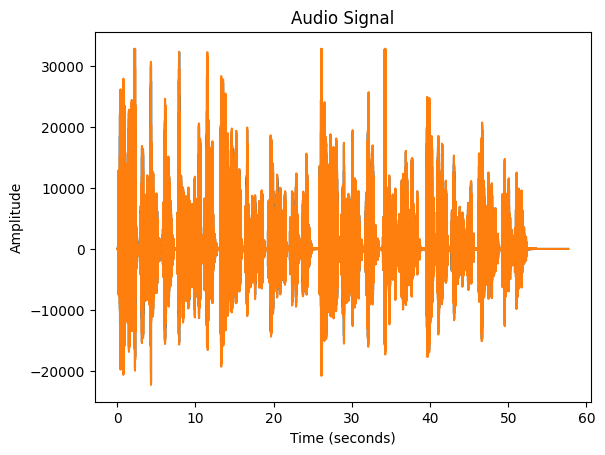

In [15]:
# Each value in time corresponds to a timestamp for the samples in sounddata.
# Plotting the waveform of the audio signal against time

import matplotlib.pyplot as plt

plt.plot(time, sounddata)
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.title('Audio Signal')
plt.show()


### Installing Transformers Library

In [16]:
!pip install -q transformers

In [17]:
import soundfile as sf
import librosa
import torch
from transformers import Wav2Vec2ForCTC, Wav2Vec2Tokenizer

1. import soundfile as sf

  - **What It Is**: The soundfile library provides functionality for reading and writing sound files in various formats, including WAV, FLAC, and OGG.
  - **Use in Speech-to-Text**:
    - Audio File Handling: You can use it to load audio files in a wide range of formats and retrieve both the audio data and the sample rate.
    - File Export: It can also save processed audio data to a file if needed.

2.  import librosa

  - **What It Is**: A powerful library for audio analysis and processing. It supports loading audio files, feature extraction (e.g., Mel Spectrograms, MFCCs), and more.

  - **Use in Speech-to-Text**:
    - Preprocessing: You can load and preprocess audio files, including resampling, trimming silence, and normalizing audio.
    - Feature Extraction: While Wav2Vec2 uses raw audio, you may use features like spectrograms or MFCCs for analysis or comparison.
    - Audio Conversion: It can handle conversions between stereo to mono or adjust sampling rates.

3. import torch

  - **What It Is**: PyTorch is a popular deep learning library used for building and deploying machine learning models.
  - **Use in Speech-to-Text**:
    - Model Loading: Load pre-trained models like Wav2Vec2ForCTC for speech-to-text tasks.
    - Inference: Use PyTorch to run the model on input audio data and process the predictions.
    - Custom Models: If you want to fine-tune a speech recognition model, PyTorch provides the necessary tools for training.

4. from transformers import Wav2Vec2ForCTC, Wav2Vec2Tokenizer

  - **What It Is**: Hugging Face's transformers library provides pre-trained models and tokenizers for natural language processing and speech recognition tasks.
    - Wav2Vec2ForCTC: A pre-trained model for speech recognition based on Facebook AI's Wav2Vec 2.0.
    - Wav2Vec2Tokenizer: Tokenizes raw audio input into a format suitable for the model and decodes the model's predictions into text.

  - **Use in Speech-to-Text**:
    - Speech Recognition: Use Wav2Vec2ForCTC to transcribe audio data into text.
    - Text Decoding: Use Wav2Vec2Tokenizer to convert the model's outputs (logits) into human-readable text.

In [18]:
tokenizer = Wav2Vec2Tokenizer.from_pretrained("facebook/wav2vec2-base-960h")
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'Wav2Vec2CTCTokenizer'. 
The class this function is called from is 'Wav2Vec2Tokenizer'.
/usr/local/lib/python3.11/dist-packages/transformers/models/wav2vec2/tokenization_wav2vec2.py:720: FutureWarning: The class `Wav2Vec2Tokenizer` is deprecated and will be removed in version 5 of Transformers. Please use `Wav2Vec2Processor` or `Wav2Vec2CTCTokenizer` instead.
  warnings.warn(


model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [19]:
input_audio,_ = librosa.load(audio_file_name, sr=16000)

In [20]:
input_values = tokenizer(input_audio, return_tensors="pt").input_values
logits = model(input_values).logits
predicted_ids = torch.argmax(logits, dim=-1)
transcription = tokenizer.batch_decode(predicted_ids)[0]

The code processes an audio file and generates its transcription using a Wav2Vec2 model. First, the audio file is loaded and resampled to a sampling rate of 16,000 Hz using librosa.load(), producing a raw waveform (input_audio). This waveform is then tokenized using the Wav2Vec2Tokenizer, which normalizes and prepares the data for the model, returning it as a PyTorch tensor (input_values). The tensor is passed to the pre-trained Wav2Vec2 model, which outputs logits representing the probabilities of each token in the vocabulary at each time step. Using torch.argmax, the most likely token is selected for each time step, yielding a sequence of predicted token IDs (predicted_ids). Finally, these token IDs are decoded into human-readable text using the tokenizer's batch_decode method, resulting in the final transcription (transcription). This process effectively converts audio into text.

In [22]:
text = tokenizer.batch_decode(predicted_ids)[0]

text

'YOUR HANDS LIE OPEN IN THE LONG FRESH GRASS THE FINGER POINTS LOOK THROUGH LIKE ROSY BLOOMS YOUR EYES SMILE PEACE THE PASTURE GLEAMS AND GLOOMS NEATH BILLOWING SKIES THAT SCATTER AND AMASS ALL ROUND OUR NEST FAR AS THE EYE CAN PASS OUR GOLDEN KEENCUP FIELDS WITH SILVER EDGE WHERE THE COW PARSLY SKIRTS THE HAWTHORN HEDGE TIS VISIBLE SILENCE STILL AS THE OUR GLASS YOUR HANDS LIE OPEN IN THE LONG FRESH GRASS THE FINGER POINTS LOOK THROUGH LIKE ROSY BLOOMS YOUR EYES SMILE PEACE THE PASTURE GLEAMS AND GLOOMS NEATH BILLOWING SKIES THAT SCATTER AND AMASS ALL ROUND OUR NEST FAR AS THE EYE CAN PASS OUR GOLDEN KEN CUP FIELDS WITH SILVER EDGE WHERE THE COW PARSLY SKIRTS THE HAWTHORN HEDGE TIS VISIBLE SILENCE STILL AS THE OUR GLASS'

## Summary of the Workflow

- Load Audio: The raw audio is loaded and resampled to 16 kHz.
- Tokenization: The audio is preprocessed and converted to model-compatible input.
- Model Inference: The model predicts logits for each time step in the audio.
- Predicted IDs: The logits are converted to token IDs using argmax.
- Decoding: The token IDs are decoded into text, resulting in the transcription.

**Example Output**
For an input audio file containing the phrase "hello world":

- input_audio: Raw waveform data of the audio.
- input_values: Preprocessed audio data as a tensor.
- logits: Model outputs, showing confidence for each token.
- predicted_ids: Token IDs corresponding to "hello world".
- transcription: "hello world".

This is how you extract text from an audio file using Wav2Vec2!